<a href="https://colab.research.google.com/github/helgadenes/Computational_Physics_USFQ/blob/main/Unit_3/3_10_3D_integrals_spectral_line_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Working with a 3D data cube (Astrophysics)

requirements: astropy, numpy, matplotlib

contents:
- reading in fits data cubes (3D spectral line data - HI data of a galaxy)
- plotting slices of the 3D data cube
- downloading astronomical images from a database (for the same galaxy as the HI data)
- making an overlay of the HI data onto an optical image
- Plotting the HI spectrum of a galaxy
- calculating the HI mass of a galaxy
- making moment maps

## Resources
- Google is your best friend. If you have coding questions, it is likely that someone also had the same question before and there are answers online.
- The documentation of the different python packages, e.g. matplotlib, numpy, astropy is good. You can find a lot of useful information there.
- stackoverflow is a website where people can ask questions of the community. There are generally good solutions there to problems.
- The astropy website has several tutorials and examples that can help you to learn how to do plots and calculations with the package: https://learn.astropy.org/
- There are also several other websites with various free python tutorials

- A collection of lecture notes on Radio astronomy: https://science.nrao.edu/opportunities/courses/era This is a very good resource to learn more about radio astronomy
- usefull information on the spectral lines in general: https://www.cv.nrao.edu/~sransom/web/Ch7.html#E155 This has all the relevant equations

In [105]:
# this installs the relevant packages once uncommented

! pip install reproject

In [147]:
# loading in relevant packages
# basic python packages
import numpy as np
import matplotlib.pyplot as plt

# astronomy specific packages
from astropy.io import fits
from astropy import units as u
from astropy.coordinates import SkyCoord
from astropy.wcs import WCS
from reproject import reproject_interp
from astropy.table import Table
from astropy.visualization import PercentileInterval, AsinhStretch


In [107]:
# this is to access files from Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Read in the data file (fits file)
The data used in this tutorial is the publicly available data from the VIVA (VLA Imaging of Virgo in Atomic gas) Survey: http://www.astro.yale.edu/viva/

In particular, the tutarial is using data for the galaxy NGC 4192 (also known as Messier 98). The data is available from here: http://www.astro.yale.edu/cgi-bin/viva/galaxy.cgi?ngc4192

We are using this data because the 3D data cubes are relatively small (~20MB) from this survey. The newer HI data cubes can be several hundreds of MB, or if they contain more galaxies then even several GB.

Illustration of a 3D spectral line data cube:

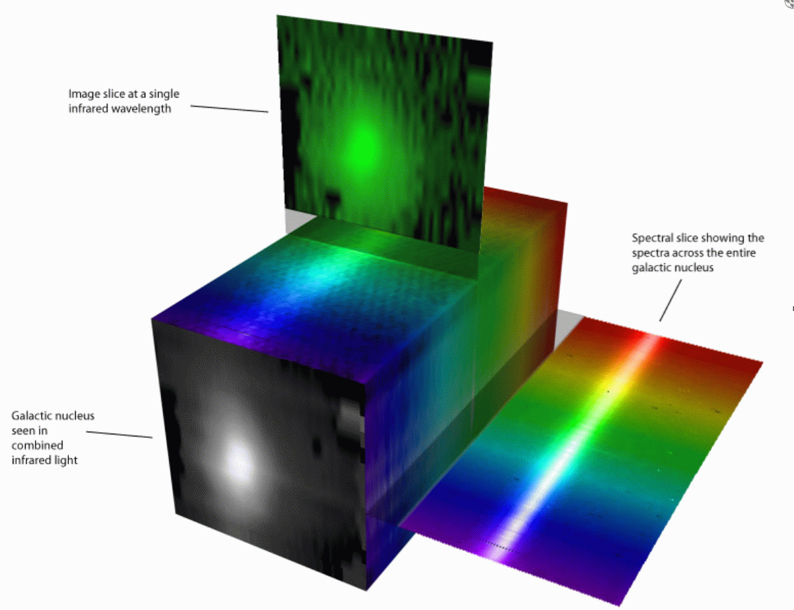

In [108]:
# location of the data files
directory = 'drive/MyDrive/Colab Notebooks/CP_1/Unit_3/'

file = directory+'/ngc4192.cube.fits'
hdul = fits.open(file)

# Fits files have a header part, which contains the metadata of the file, in this case the details of the observation
h = hdul[0].header

# and a data part, which is esentially an N dimensional matrix with numbers
d = hdul[0].data

## Have a look at the content of the file
print the information in the header
have a look at the shape (dimensions) of the data
have a look at the data

In [109]:
# printing the header / metadata
print(h.keys)

<bound method Header.keys of SIMPLE  =                    T /                                                
BITPIX  =                  -32 /                                                
NAXIS   =                    4 /                                                
NAXIS1  =                  256 /                                                
NAXIS2  =                  256 /                                                
NAXIS3  =                   62 /                                                
NAXIS4  =                    1 /                                                
EXTEND  =                    T /Tables following main image                     
BLOCKED =                    T /Tape may be blocked                             
OBJECT  = 'N4192   '           /Source name                                     
TELESCOP= 'VLA     '           /                                                
INSTRUME= 'VLA     '           /                                                

In [110]:
# checking the data
print(d.shape)
# This is a 4 dimensional data cube: RA, DEC coordinates, frequency, polarisation
# However HI is unpolarised emissio, so the 4th axis in this case is meaningless
# Note: Python swaps the order of the axes (axis 0 is polarization, axis 3 is RA)

(1, 62, 256, 256)


In [111]:
# Let's remove the reduntant axis
d_2 = d[0,:,:,:]
print(d_2.shape)

(62, 256, 256)


## Plot slices of the cube


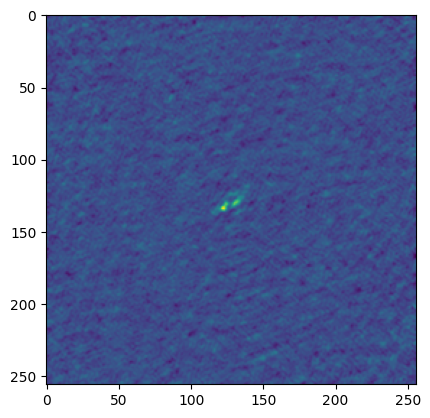

In [112]:
# lets quickly plot slice 30
plt.imshow(d_2[30,:,:])

### Plot several slices of the data in one figure
- use subplots in matplotlib

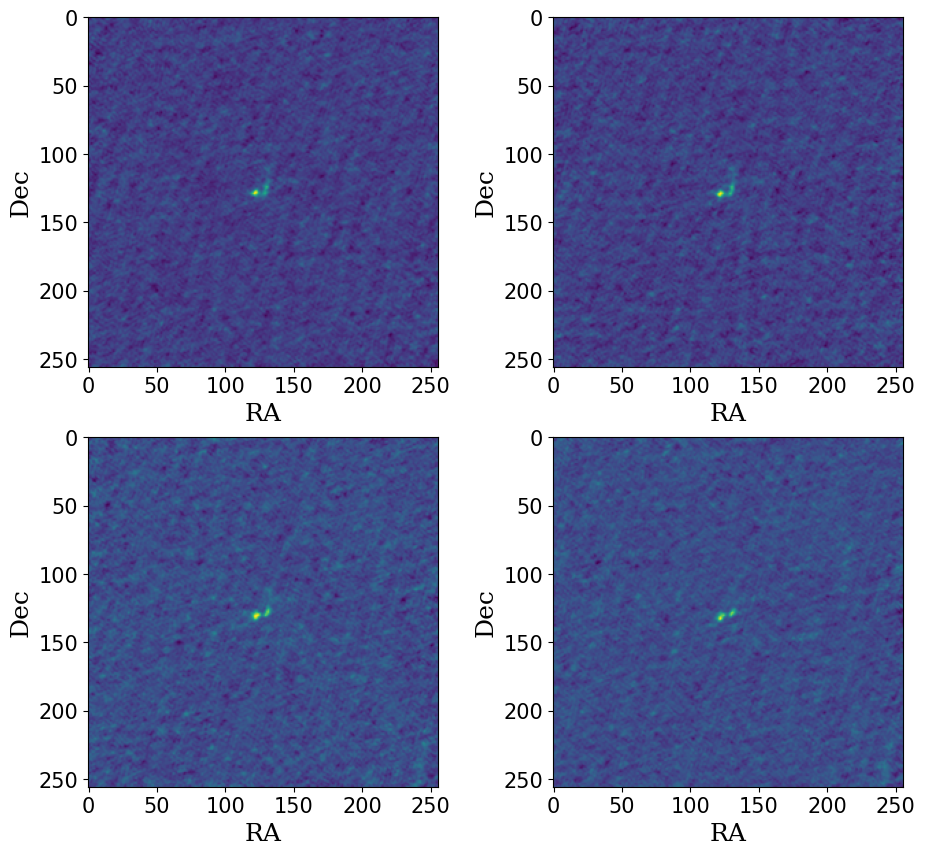

In [113]:
fig = plt.figure(figsize=(11,10))

for j,i in enumerate(range(25,29), start=1):
    ax = fig.add_subplot(2,2,j)
    plt.imshow(d_2[i,:,:])
    ax.set_xlabel('RA', size=18,family='serif')
    ax.set_ylabel('Dec', size=18,family='serif')
    #plt.xlim([0,9])
    #plt.ylim([0,9])
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

plt.savefig(directory+'ngc4192_test.png')

### Plot one spatial axis and the frequency axis
This shows how is the gas moving inside the galaxy.

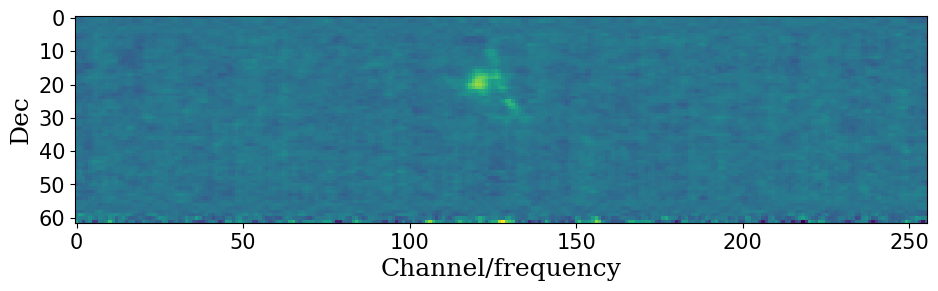

In [114]:
fig = plt.figure(figsize=(11,10))

ax = fig.add_subplot(1,1,1)
plt.imshow(d_2[:,125,:])
ax.set_xlabel('Channel/frequency', size=18,family='serif')
ax.set_ylabel('Dec', size=18,family='serif')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.show()

## Average some channels

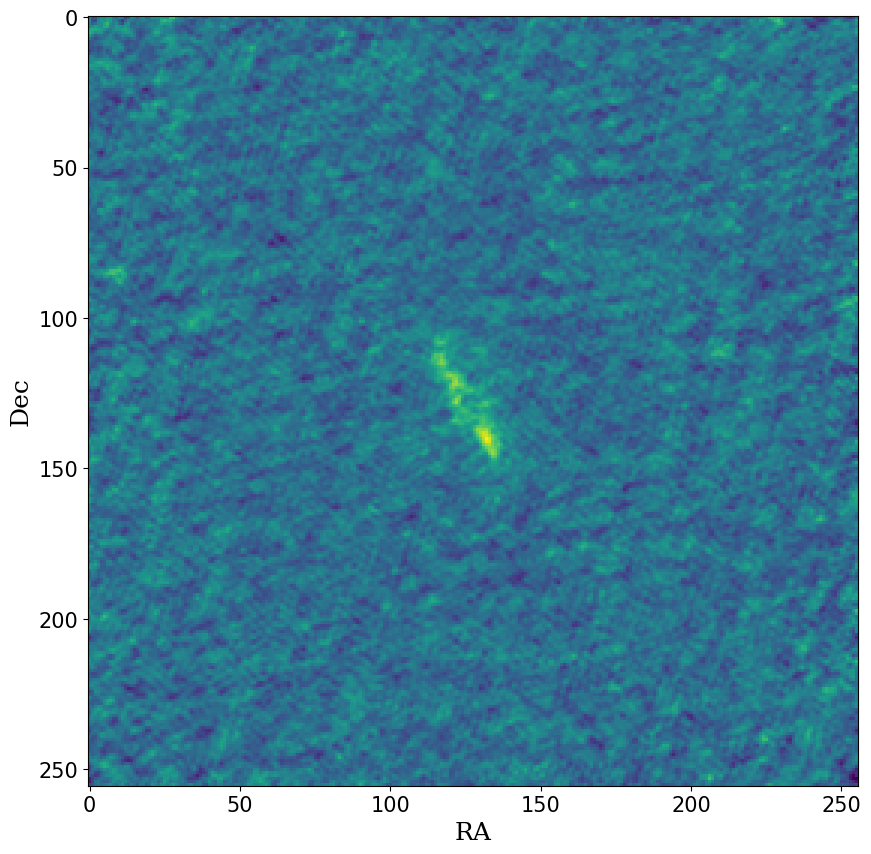

In [115]:
fig = plt.figure(figsize=(11,10))

d_2_av = np.mean(d_2, axis=0)

ax = fig.add_subplot(1,1,1)
plt.imshow(d_2_av)
ax.set_xlabel('RA', size=18,family='serif')
ax.set_ylabel('Dec', size=18,family='serif')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.show()

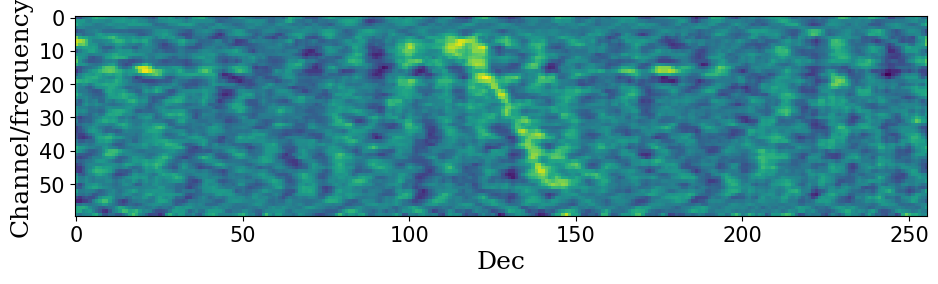

In [116]:
# Let's have a better look at how the gas is moving inside the galaxy

fig = plt.figure(figsize=(11,8))

# Let's sum the data to get a better picture of all the gas in the data cube
d_2_sum = np.sum(d_2, axis=2) # axis 2 is the RA

ax = fig.add_subplot(1,1,1)
plt.imshow(d_2_sum[:-2,:])

ax.set_xlabel('Dec', size=18,family='serif')
ax.set_ylabel('Channel/frequency', size=18,family='serif')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.show()

## Mask the cube
Mask the noisy pixels, i.e. pixles with signal to noise less than 3

### Calculate the rms of the data
Thsi can be used for a treshold. For example 5 sigma is usually a good lower treshold for detection

In [117]:
def calc_rms(x):
    rms = np.sqrt(np.mean(x**2))
    return rms

rms = calc_rms(d_2)
print(rms)

0.0013798041


In [118]:
# Mask the cube, to only retain signal that is above 3 times the rms

d_3 = np.where(d_2 < 3*rms, 0, d_2)
print(d_3.shape)

(62, 256, 256)


## Create an integrated intensity maps

This is also called a moment 0 map. For this, we integrate all pixels along the frequency axis.
$$M_0 = \int i_{\nu} d\nu$$

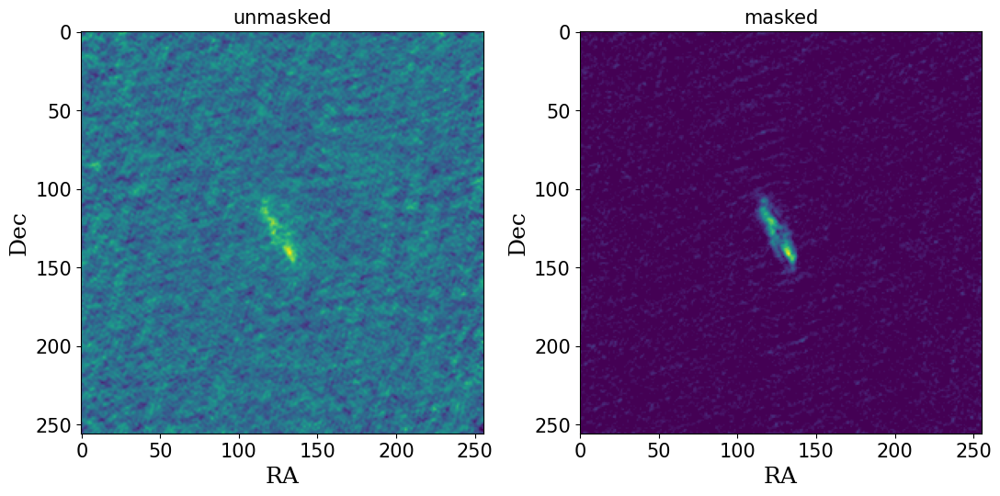

In [119]:
fig = plt.figure(figsize=(11,10))

# Let's sum the data along the velocity axis
# By multiplying with the width of the velocity channels, we get the integrated intensity map
# this is also called the 0 orderd moment of the data or moment 0 map
d_2_mom0 = np.sum(d_2, axis=0)* abs(h['CDELT3'])/1000  # original data
d_3_mom0 = np.sum(d_3, axis=0)* abs(h['CDELT3'])/1000  # masked data

ax = fig.add_subplot(1,2,1)
plt.imshow(d_2_mom0)
plt.title('unmasked', fontsize=15)
ax.set_xlabel('RA', size=18,family='serif')
ax.set_ylabel('Dec', size=18,family='serif')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

ax = fig.add_subplot(1,2,2)
plt.imshow(d_3_mom0)
plt.title('masked', fontsize=15)
ax.set_xlabel('RA', size=18,family='serif')
ax.set_ylabel('Dec', size=18,family='serif')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.tight_layout()

plt.show()


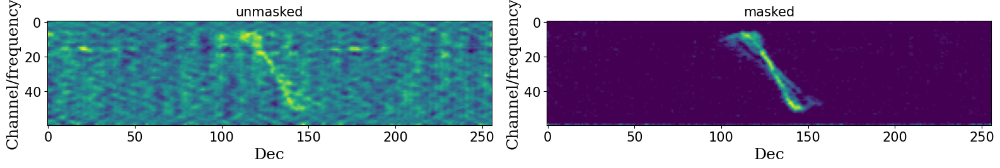

In [120]:
# Comparing the motion of the gas in the galaxy between the masked and unmasked image

fig = plt.figure(figsize=(16,8))

d_3_sum = np.sum(d_3, axis=2)

ax = fig.add_subplot(1,2,1)
plt.imshow(d_2_sum[:-2,:])
plt.title('unmasked', fontsize=15)
ax.set_xlabel('Dec', size=18,family='serif')
ax.set_ylabel('Channel/frequency', size=18,family='serif')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

ax = fig.add_subplot(1,2,2)
plt.imshow(d_3_sum[:-2,:])
plt.title('masked', fontsize=15)
ax.set_xlabel('Dec', size=18,family='serif')
ax.set_ylabel('Channel/frequency', size=18,family='serif')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.tight_layout()

plt.show()

### Save the integrated intensity map (moment 0 map)

In [121]:
# saving data in a fits file

# first we define some values for the header
wcs_new = WCS(naxis=2)
wcs_new.wcs.cdelt = [h['CDELT1'], h['CDELT2']]
wcs_new.wcs.ctype = [h['CTYPE1'], h['CTYPE2']]
wcs_new.wcs.crval = [h['CRVAL1'], h['CRVAL2']]
wcs_new.wcs.crpix = [h['CRPIX1'], h['CRPIX2']]
header = wcs_new.to_header()

# add the data and the header to an object that can be written into a file
hdul_new = fits.PrimaryHDU(d_3_mom0, header=header)
hdul_new.writeto(directory+'mom0.fits', overwrite=True)

## Check the saved mom 0 map

In [122]:
# Loading the saved moment 0 map:
file = directory+'/mom0.fits'
hdul_mom0 = fits.open(file)
h_mom0 = hdul_mom0[0].header
d_mom0 = hdul_mom0[0].data

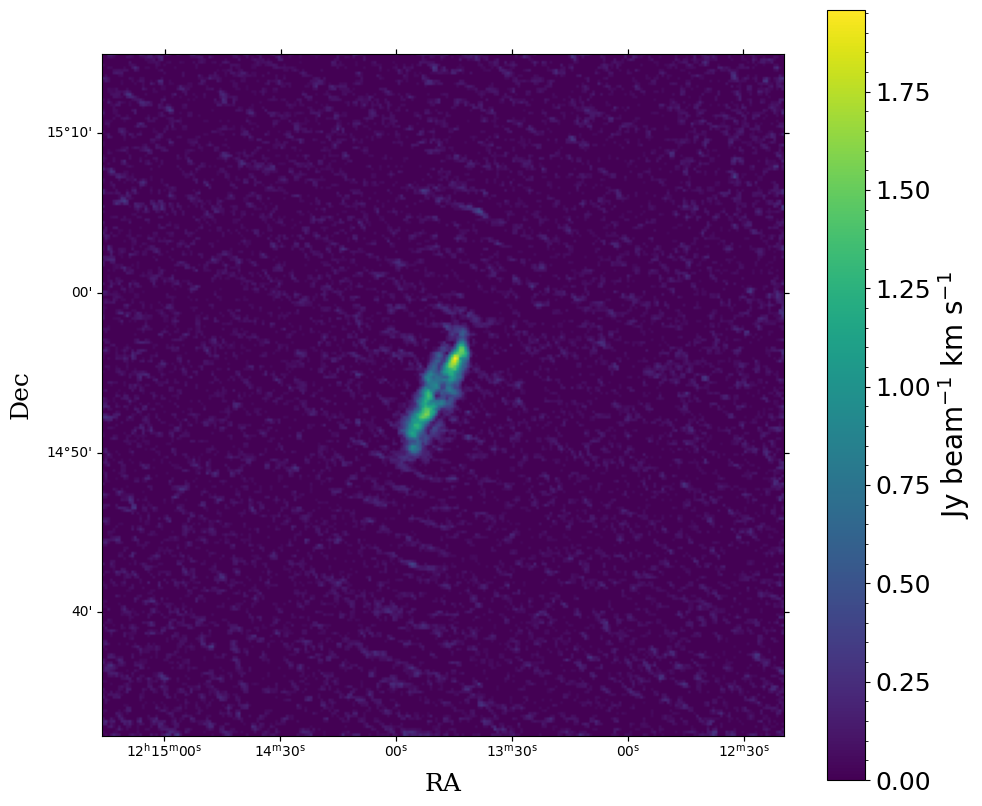

In [123]:
# Making a figure
fig = plt.figure(figsize=(11,10))
ax = fig.add_subplot(1,1,1, projection=WCS(h_mom0))  # by using the projection argument and the WCS package you can have the x and y axis in sky coordinates
cb = plt.imshow(d_mom0)
ax.set_xlabel('RA', size=18,family='serif')
ax.set_ylabel('Dec', size=18,family='serif')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

# adding a colour bar:
cbar =fig.colorbar(cb)
cbar.minorticks_on()
cbar.ax.tick_params(labelsize=18)
cbar.ax.set_ylabel(r'Jy beam$^{-1}$ km s$^{-1}$', fontsize=20)

fig.show()


## Make an overlay on an optical image

For this we are going to grab an image from an online data base based on the coordinates of the HI data cube. Then we are going to grid the images to eachother to match the pixels and make the overlay.

### retrieve optical image from an online archive
We are going to use PanSTARRS here.

You can check out this tutorial for more options and information to download images: https://spacetelescope.github.io/mast_notebooks/notebooks/PanSTARRS/PS1_image/PS1_image.html  

The home page of the PanSTARRS data archive: https://outerspace.stsci.edu/display/PANSTARRS/

PanSTARRS survey covers a large part of the northern sky.

In [124]:
# Function to retrieve data table with information on the images

def get_image_table(ra,dec,filters="grizy"):
    """
    Query ps1filenames.py service to get a list of images

    ra, dec = position in degrees
    filters = string with filters to include. includes all by default
    Returns a table with the results
    """
    service = "https://ps1images.stsci.edu/cgi-bin/ps1filenames.py"
    # The final URL appends our query to the PS1 image service
    url = f"{service}?ra={ra}&dec={dec}&filters={filters}"
    # Read the ASCII table returned by the url
    table = Table.read(url, format='ascii')
    return table

In [125]:
# Function to get url for the fits file

def get_imurl(ra, dec, size=240, filters="grizy", im_format="fits"):
    """
    Get URL for images in the table

    ra, dec = position in degrees
    size = extracted image size in pixels (0.25 arcsec/pixel)
    filters = string with filters to include. choose from "grizy"
    format = data format (options are "jpg", "png" or "fits")
    Returns a string with the URL
    """

    # Call the original helper function to get the table
    table = get_image_table(ra,dec,filters=filters)
    url = (f"https://ps1images.stsci.edu/cgi-bin/fitscut.cgi?"
           f"ra={ra}&dec={dec}&size={size}&format={im_format}")
    # Use red for monochrome images
    urlbase = url + "&red="
    url = []
    filename = table[0]['filename']
    url = urlbase+filename

    return url

In [126]:
# get the central coordinate of the image
# we want to get an optical image with the same coordiantes

c = SkyCoord(h_mom0['CRVAL1'], h_mom0['CRVAL2'], unit="deg")
print(c.to_string('hmsdms'))

12h13m48.18055632s +14d53m42.46116972s


In [127]:
# get url for fits
url = get_imurl(c.ra.deg, c.dec.deg, im_format='fits', size=3000, filters='g')


In [128]:
# open fits file of the optical image

fh = fits.open(url)
d_opt = fh[0].data
h_opt = fh[0].header

In [129]:
# inspect the header
h_opt[:20]

SIMPLE  =                    T / file does conform to FITS standard             
BITPIX  =                  -32 / number of bits per data pixel                  
NAXIS   =                    2 / number of data axes                            
NAXIS1  =                 3000 / length of data axis 1                          
NAXIS2  =                 3000 / length of data axis 2                          
EXTEND  =                    T / FITS dataset may contain extensions            
COMMENT   FITS (Flexible Image Transport System) format is defined in 'Astronomy
COMMENT   and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H 
DATE    = '2025-11-10T15:37:21' / file creation date (YYYY-MM-DDThh:mm:ss UT)   
CTYPE1  = 'RA---TAN'                                                            
CTYPE2  = 'DEC--TAN'                                                            
CRVAL1  =     184.090911865194                                                  
CRVAL2  =     13.99999999999

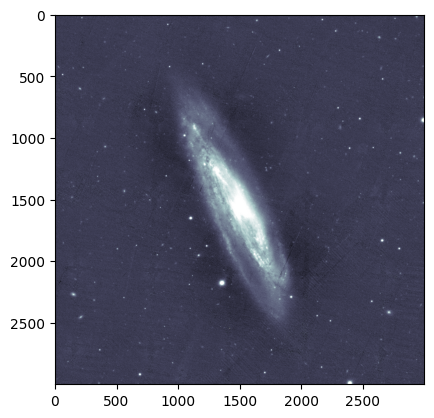

In [130]:
# make a simple plot to check the retrieved image

transform = AsinhStretch() + PercentileInterval(99.5)
plt.imshow(transform(d_opt), cmap='bone')

### Reproject the HI image onto the same pixel grid as the optical image

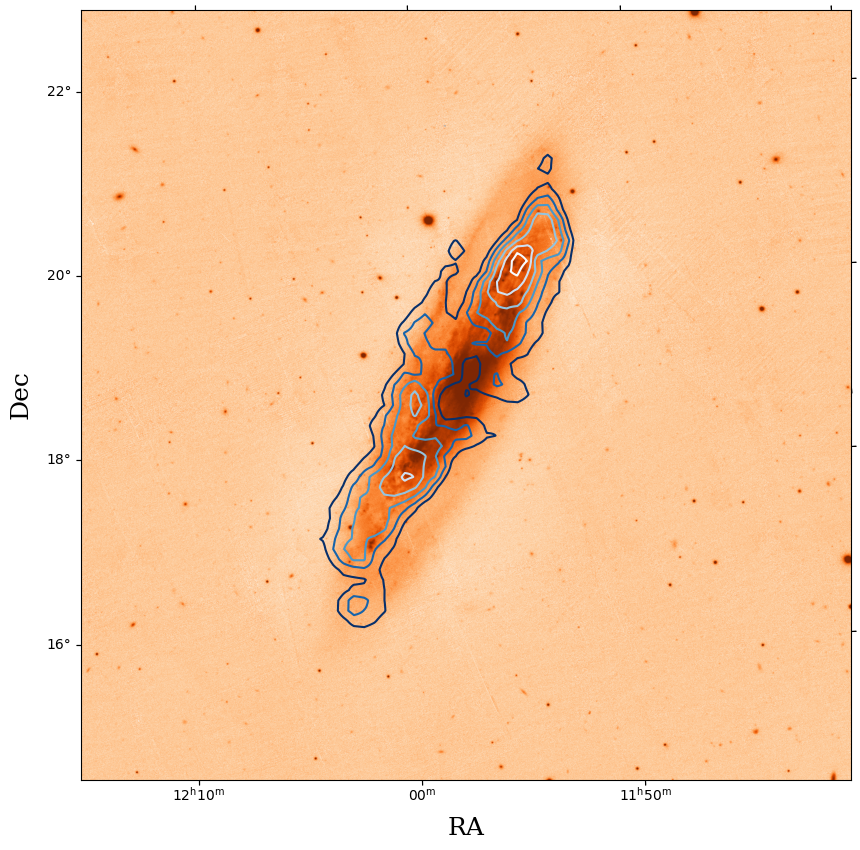

In [131]:
# To make an overlay the two images need to have the same pixel grid
# reproject the data onto the same pixel grid
# we are reprojecting the HI data onto the grid of the optical data, since the resolution of the optical data is better
hi_reprojected, footprint = reproject_interp(hdul_mom0, h_opt)

# calculate the rms (root mean square) of the reprojected HI data, to help drawing contours
rms_mom0 = calc_rms(hi_reprojected)

fig = plt.figure(figsize=(11,10))
ax = fig.add_subplot(1,1,1, projection=WCS(h_mom0))
# plot optical image as an image
ax.imshow(transform(d_opt), cmap='Oranges')
# plot HI image as contours
ax.contour(hi_reprojected, levels=np.arange(2,8)*rms_mom0, cmap='Blues_r')
ax.set_xlabel('RA', size=18,family='serif')
ax.set_ylabel('Dec', size=18,family='serif')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

fig.savefig(directory+'/ngc4192_mom0_overlay.png', dpi=200)

# Note that the HI disk is very similar in size to the stellar disk
# This is not typical for spiral galaxies



## Plot the HI spectrum of the galaxy
- plot the spectrum of one spaxel in the data
- average the spectrum in a number of pixels
- average the spectrum based on a criteria (e.g. above 5 sigma detection)

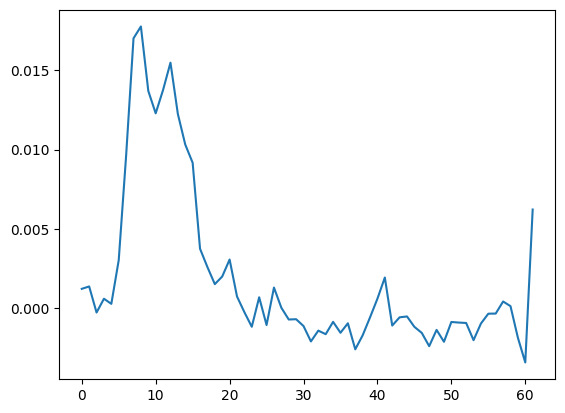

In [132]:
# lets look at the spectrum in one pixel
# Can you see the galaxy?

plt.plot(d_2[:,120,120])


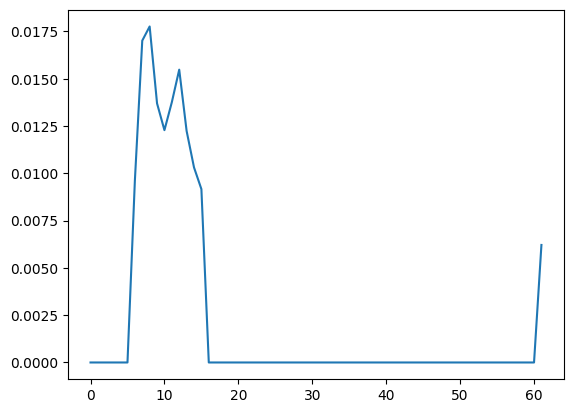

In [133]:
# lets look at the spectrum in the masked data
plt.plot(d_3[:,120,120])

To get the integrated spectra we need to sum the Intensities in the cube along the two spatial axes (R.A. and Dec.).

In [134]:
# Sum for the whole cube, but make sure to take the masked data that does not have the noise anymore
# This is the integrated spectral line profile
# Note the typical "dubble horn" shape of the profile, this is showing the rotation of the galaxy

d_sum = np.sum(d_3[:,:,:], axis = 1)
print(d_av.shape)
d_sum_3 = np.sum(d_av[:,:], axis = 1)
spectra = d_sum_3[:-3]

# checking the units of the spectral axis
print('3rd axis type', h['CTYPE3'])  # the third dimension of this cube is in heliocentric velocity
print('3rd axis steps in m/s', h['CDELT3'])
print('3rd axis reference in m/s', h['CRVAL3'])
print('data units', h['BUNIT'])

# let's define the spectral axis
x_axis = (np.arange(0,len(spectra))*h['CDELT3']+abs(h['CRVAL3'])) / 1000 # we also convert to km/s from m/s


(62, 256)
3rd axis type FELO-HEL
3rd axis steps in m/s -10304.70703
3rd axis reference in m/s -160000.0
data units JY/BEAM


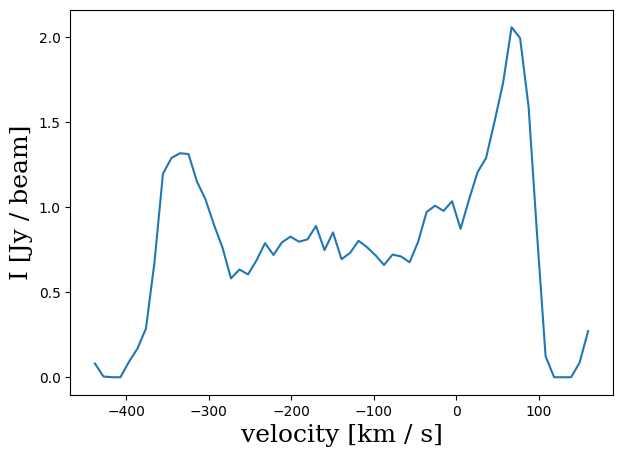

In [135]:
fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(1,1,1)
plt.plot(x_axis, spectra)  # the last channel of the data cube is bad (with very high noise), so we don't include that in the plot
ax.set_xlabel('velocity [km / s]', size=18,family='serif')
ax.set_ylabel('I [Jy / beam]', size=18,family='serif')
plt.savefig(directory+'ngc4192_HI_spectra.png')


## Calculate the HI mass of the galaxy
A good information source on galaxies is the NASA/IPAC Extragalactic Data Base (NED): https://ned.ipac.caltech.edu/

If you search the galaxy NGC 4192, you will find various informatio on it, including: coordinates, optical magnitudes, optical diameter, distance measurments, optical velocity measurment, other names, morpthological identification etc.

This is an extragalactic data base, so you can also search other catalogued galaxies in this data base.

In [136]:
# First we need the integrated Flux of the galaxy
# We only want to integrate the non zero channels
spectra_2 = spectra[spectra > 0]
chan_width = abs(h['CDELT3'])/1000

# The units of the data are Jy/beam, so we need to know the beam size
# The beam size refers to the resolution of the radio telescope and depends on the telescope and the position of the galaxy on the sky (RA and Dec)
bmax = 18.26 # major axis of beam
bmin = 16.03 # minor axis of beam in arcsec

beam_px = (np.pi * (bmax/3600/h['CDELT2']) * (bmin/3600/h['CDELT2'])) / (4 * np.log(2))  # beam size in pixels

S_int = np.sum(spectra * chan_width / beam_px)  # integrate the spectra in km/s, final unit needs to be in Jy
print(S_int)

142.4211869935455


In [137]:
# isolate the velocities for the spectral line
vel_line = x_axis[np.where(spectra > 0)]
print(vel_line)

# calculate the line centre
line_centre = (vel_line[0] + abs(vel_line[-1]))/2 + vel_line[-1]
print(line_centre)

v_opt_0 = -142.1 # systemic velocity of the galaxy in the optical velocity frame from the NED data base

# note that this galaxy has a negative optical velocity. This means that it is moving tovards the Milky Way and not away from it.
# In practice, this means that the Milky Way is moving towards the Virgo cluster.
# Only very nearby galaxies have negative velocities.

[ 160.          149.69529297  108.47646485   98.17175782   87.86705079
   77.56234376   67.25763673   56.9529297    46.64822267   36.34351564
   26.03880861   15.73410158    5.42939455   -4.87531248  -15.18001951
  -25.48472654  -35.78943357  -46.0941406   -56.39884763  -66.70355466
  -77.00826169  -87.31296872  -97.61767575 -107.92238278 -118.22708981
 -128.53179684 -138.83650387 -149.1412109  -159.44591793 -169.75062496
 -180.05533199 -190.36003902 -200.66474605 -210.96945308 -221.27416011
 -231.57886714 -241.88357417 -252.1882812  -262.49298823 -272.79769526
 -283.10240229 -293.40710932 -303.71181635 -314.01652338 -324.32123041
 -334.62593744 -344.93064447 -355.2353515  -365.54005853 -375.84476556
 -386.14947259 -396.45417962 -427.36830071 -437.67300774]
-138.83650387


### Calculate the distance to the galaxy

The Hubble flow distance: $D_{hf} = \frac{|v_{opt}|}{ h_{0}} $

where $v_{opt}$ is the velocity (based on redshift) of the galaxy in the optical frame, and  $h_{0}$ is the Hubble constant.

In [138]:
H_0 = 70 # Hubble constant

v_opt_line = line_centre # (the middle of the integrated line profile)

distance_hf = abs(v_opt_line) / H_0   # This is the way to calculate the hubble flow distance to galaxies
distance = 16 # in MPc - in the case of this galaxy the hubble flow distances are not accurate because the galaxy has a relatively large peculiar motion compared to its systematic velocity
# for this tutorial we will use 16 MPc for the distance of all Virgo cluster galaxies

print('Comapring hubble flow distance to Virgo cluster distance:', distance_hf, distance)


Comapring hubble flow distance to Virgo cluster distance: 1.9833786267142857 16


The HI mass of a galaxy: $M_{HI} = 2.36 \times 10^{5} S_{int} * D^{2}$ where $S_{int}$ is the integrated HI flux and $D$ is the distance to the galaxy in Mpc.

In [139]:
# Now calculating the HI mass of the galaxy

m_HI = 2.36 * 10**5 * S_int * distance**2
print(r'HI mass in units of 10$^{8} M_{sun}$:', m_HI/10**8)

HI mass in units of 10$^{8} M_{sun}$: 86.04518433402045


## Making a map of the velocity field (moment 1)

A moment 1 map is the intensity weighted velocity field of the galaxy. $$\frac{\int{v I_{v} dv}}{\int I_{\nu}d \nu}$$

/tmp/ipython-input-3599884284.py:6: RuntimeWarning: divide by zero encountered in divide
  d_3_mom1 = np.sum(d_3, axis=0)* abs(h['CDELT3'])/1000/d_mom0  # this is the moment 1 map of the data


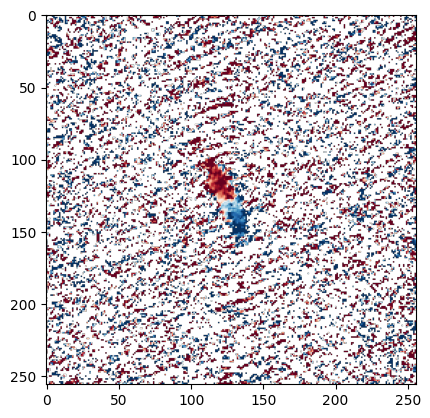

In [140]:
d_3 = d_2.copy()

for i in range(len(x_axis)):
    d_3[i,:,:] = x_axis[i] * d_3[i,:,:]

d_3_mom1 = np.sum(d_3, axis=0)* abs(h['CDELT3'])/1000/d_mom0  # this is the moment 1 map of the data


plt.imshow(d_3_mom1, cmap = 'RdBu_r', vmin = -400, vmax = 100)

In [141]:
# the moment 1 map is a bit noisy, so we will apply a mask that only keeps the part that overlaps with the integrated intensity map (moment 0)

mom0_mask = np.array(d_mom0)
mom0_mask[mom0_mask < 0.5] = 'nan'  # set the noise to nan
mom0_mask[mom0_mask > 0.5] = 1

mom1_clean = np.array(d_3_mom1)* mom0_mask

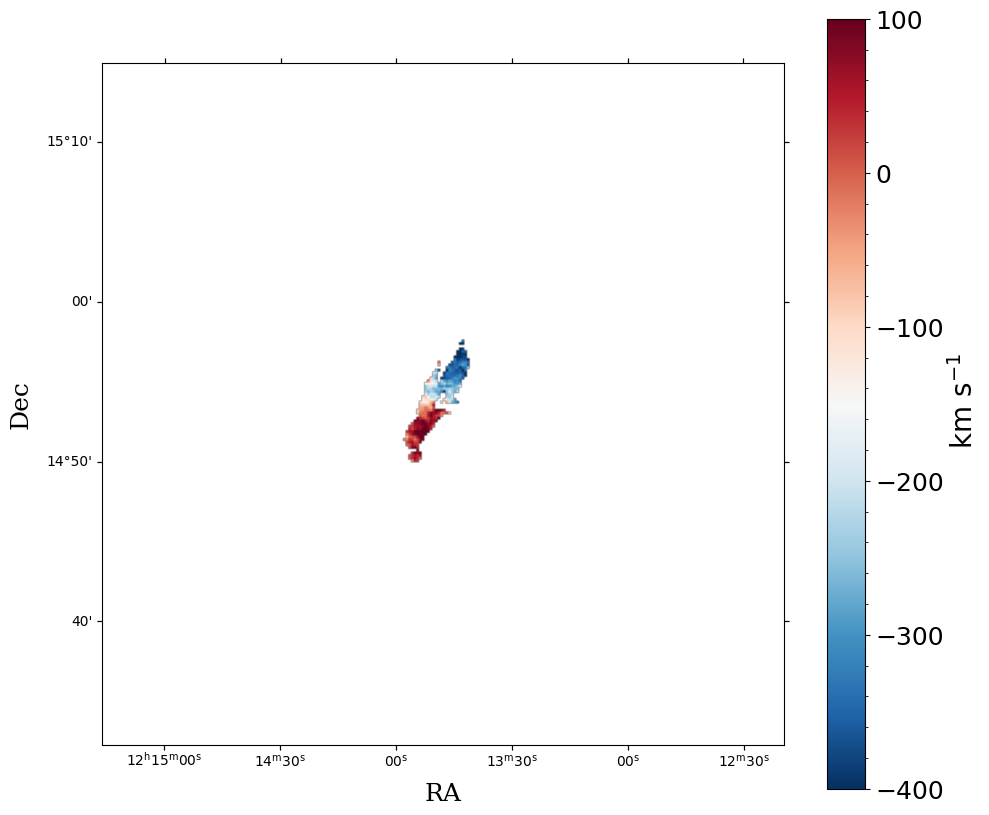

In [142]:
fig = plt.figure(figsize=(11,10))
ax = fig.add_subplot(1,1,1, projection=(WCS(h_mom0)))
cb = plt.imshow(mom1_clean, cmap='RdBu_r', vmin = -400, vmax = 100)
ax.set_xlabel('RA', size=18,family='serif')
ax.set_ylabel('Dec', size=18,family='serif')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

cbar =fig.colorbar(cb)
cbar.minorticks_on()
cbar.ax.tick_params(labelsize=18)
cbar.ax.set_ylabel(r' km s$^{-1}$', fontsize=20)
plt.show()

# the rotation of the gas in the galaxy is clearly visible
# the red side is redshifted spectral lines -> the gas is moving away from us
# the blue side is blushifted lines -> the gas is moving towards us

## Bonus: Let's animate the data in the cube

/tmp/ipython-input-431969006.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(6,5))


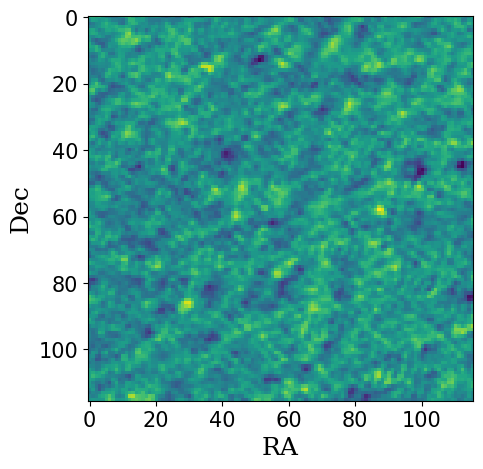

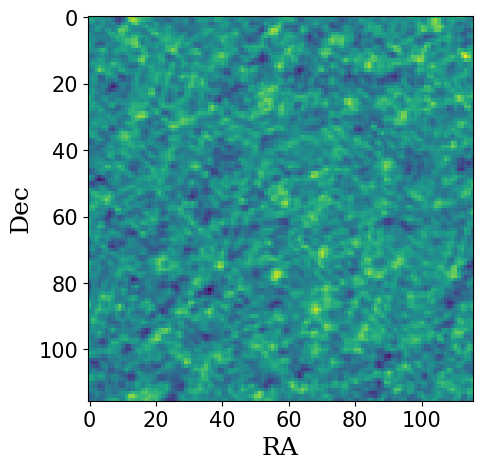

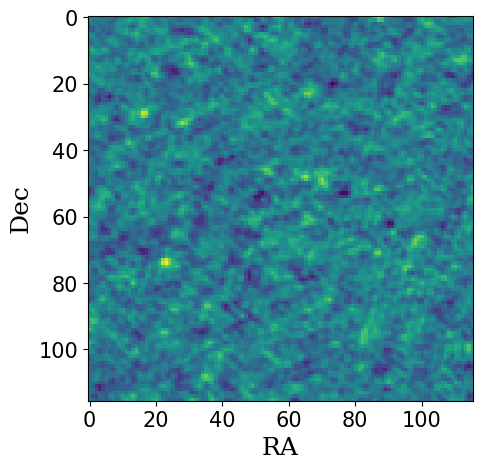

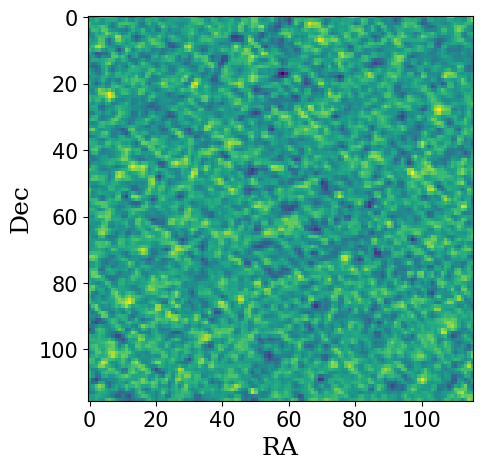

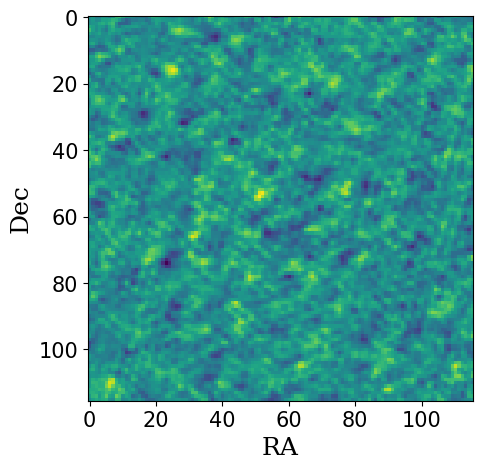

...

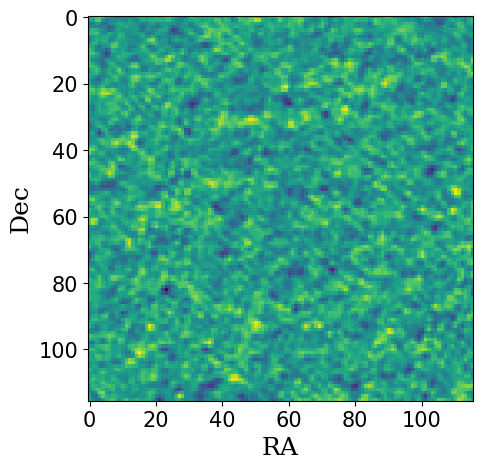

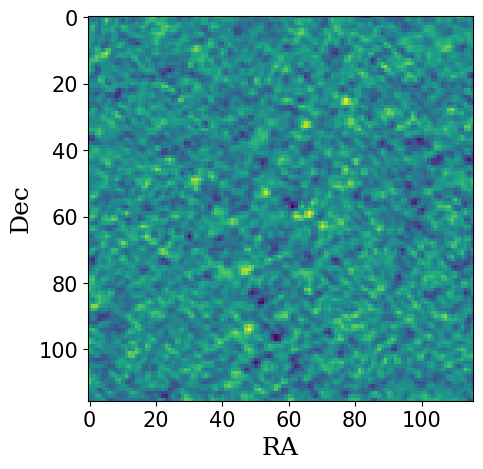

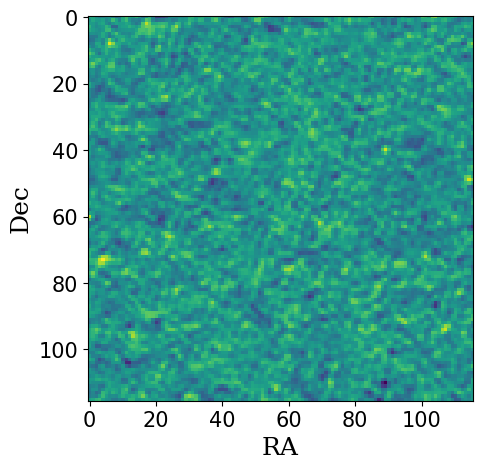

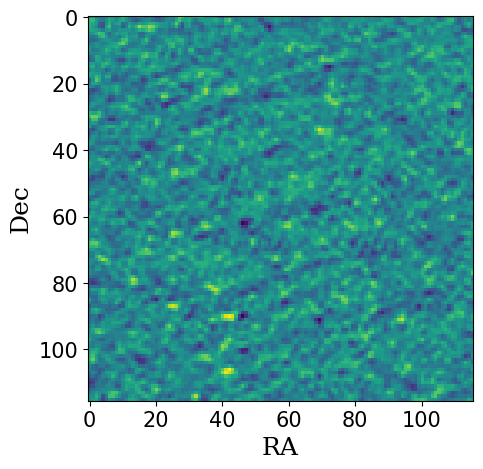

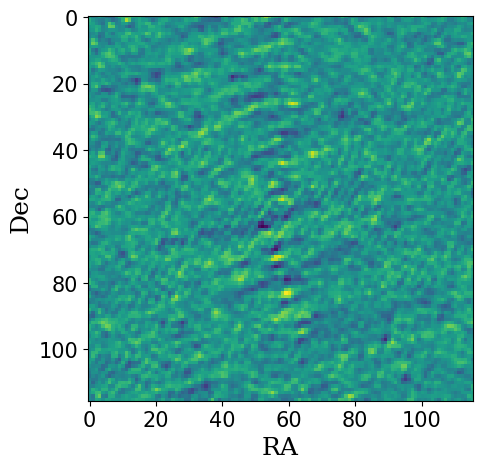

In [143]:
# make images of all of the velocity channels
# the images are saved in a directory called plots

# we will loop trough all channels
for i in range(d_3.shape[0]):
    fig = plt.figure(figsize=(6,5))
    ax = fig.add_subplot()
    plt.imshow(d_2[i,70:-70,70:-70]) # we select the pixels in the middle of the image, to zoom in on the galaxy
    ax.set_xlabel('RA', size=18,family='serif')
    ax.set_ylabel('Dec', size=18,family='serif')
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

    plt.savefig(directory+'plots/ngc4192_{:02d}.png'.format(i)) # saving the figure using all 2 digit numbers

In [144]:
# We will need some additional python packages for the animation
import glob
from PIL import Image
import os
from IPython import display

In [145]:
# input images
images_input = directory +'plots/ngc4192_***.png'
# output gif
imgif_output = directory + "animation.gif"

# Collect the images
imgs = (Image.open(f) for f in sorted(glob.glob(images_input)))

img = next(imgs)

# save the gif file
img.save(fp = imgif_output, format = "GIF", append_images = imgs, save_all = True, duration = 120, loop = 0)

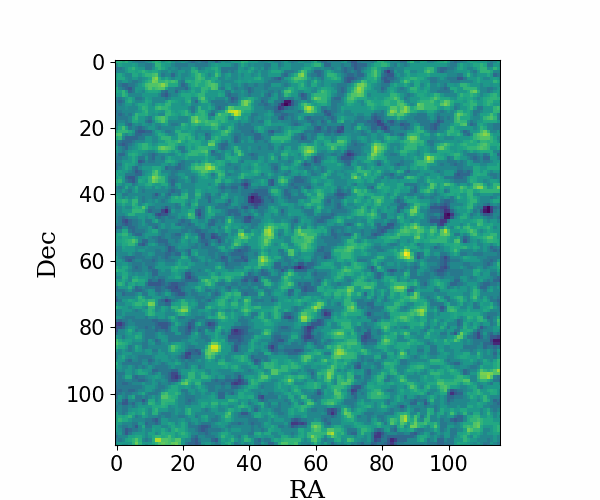

In [146]:
# Show the animation
display.Image(directory + "animation.gif")